
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


Amir Mohammad Mahfoozi 401106469


This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [ ]:
!pip install pytorch_lightning
!pip install seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.3/819.3 kB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 46.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import torch.optim as optim
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
import cv2
from PIL import Image
from torchvision import models
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [14]:
# !unzip predict.zip
# !unzip test-20241213T094321Z-001.zip
# !unzip train.zip
# !unzip valid.zip

Archive:  train.zip
  inflating: train/AFRICAN FIREFINCH/108.jpg  
  inflating: train/AFRICAN FIREFINCH/042.jpg  
  inflating: train/AFRICAN FIREFINCH/016.jpg  
  inflating: train/AFRICAN FIREFINCH/128.jpg  
  inflating: train/AFRICAN FIREFINCH/057.jpg  
  inflating: train/AFRICAN FIREFINCH/088.jpg  
  inflating: train/AFRICAN FIREFINCH/041.jpg  
  inflating: train/AFRICAN FIREFINCH/027.jpg  
  inflating: train/AFRICAN FIREFINCH/102.jpg  
  inflating: train/AFRICAN FIREFINCH/073.jpg  
  inflating: train/AFRICAN FIREFINCH/026.jpg  
  inflating: train/AFRICAN FIREFINCH/054.jpg  
  inflating: train/AFRICAN FIREFINCH/105.jpg  
  inflating: train/AFRICAN FIREFINCH/039.jpg  
  inflating: train/AFRICAN FIREFINCH/053.jpg  
  inflating: train/AFRICAN FIREFINCH/114.jpg  
  inflating: train/AFRICAN FIREFINCH/063.jpg  
  inflating: train/AFRICAN FIREFINCH/136.jpg  
  inflating: train/AFRICAN FIREFINCH/098.jpg  
  inflating: train/AFRICAN FIREFINCH/095.jpg  
  inflating: train/AFRICAN FIREFINCH/001

In [15]:
import os
import pandas as pd

def get_class_map():
    return {}, 0

def process_class_folder(class_folder, class_folder_path, class_map, class_counter):
    filenames = []
    outcomes = []
    if class_folder not in class_map:
        class_map[class_folder] = class_counter
        class_counter += 1

    for file in tqdm(os.listdir(class_folder_path)):
        if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
            full_path = os.path.join(class_folder_path, file)
            filenames.append(full_path)
            outcomes.append(class_map[class_folder])

    return filenames, outcomes, class_counter

def collect_data_from_path(path, class_map, class_counter):
    all_filenames = []
    all_outcomes = []
    for class_folder in os.listdir(path):
        class_folder_path = os.path.join(path, class_folder)
        if os.path.isdir(class_folder_path):
            filenames, outcomes, class_counter = process_class_folder(
                class_folder, class_folder_path, class_map, class_counter
            )
            all_filenames.extend(filenames)
            all_outcomes.extend(outcomes)
    return all_filenames, all_outcomes, class_map

def create_dataframe(filenames, outcomes):
    df = pd.DataFrame({'filename': filenames, 'outcome': outcomes})
    return df.sample(frac=1).reset_index(drop=True)

def load_data(path):
    class_map, class_counter = get_class_map()
    filenames, outcomes, class_map = collect_data_from_path(path, class_map, class_counter)
    df = create_dataframe(filenames, outcomes)
    return df, class_map

train_path = "./train"
valid_path = "./valid"
test_path = "./test"

train_data, train_map = load_data(train_path)
valid_data, val_map = load_data(valid_path)
test_data, test_map = load_data(test_path)

print(f"Train: {train_data.shape}, Validation: {valid_data.shape}, Test: {test_data.shape}")


  0%|          | 0/161 [00:00<?, ?it/s]

  0%|          | 0/164 [00:00<?, ?it/s]

  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/170 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/154 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

  0%|          | 0/155 [00:00<?, ?it/s]

  0%|          | 0/166 [00:00<?, ?it/s]

  0%|          | 0/137 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/158 [00:00<?, ?it/s]

  0%|          | 0/137 [00:00<?, ?it/s]

  0%|          | 0/165 [00:00<?, ?it/s]

  0%|          | 0/166 [00:00<?, ?it/s]

  0%|          | 0/155 [00:00<?, ?it/s]

  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Train: (3208, 2), Validation: (100, 2), Test: (100, 2)


In [16]:
def combine_dataframes(*dataframes):
    combined_df = pd.concat(dataframes, axis=0).reset_index(drop=True)
    return combined_df

combined_data = combine_dataframes(train_data, test_data)

print(f"Combined Data Shape: {combined_data.shape}")


Combined Data Shape: (3308, 2)


In [17]:
# TODO: Explore the new DataFrame
print(combined_data.head())

                            filename  outcome
0   ./train/AMERICAN KESTREL/091.jpg       18
1          ./train/ALBATROSS/101.jpg       19
2  ./train/AFRICAN FIREFINCH/068.jpg       15
3      ./train/AMERICAN COOT/014.jpg       14
4   ./train/AMERICAN KESTREL/076.jpg       18


## Plot some of the images

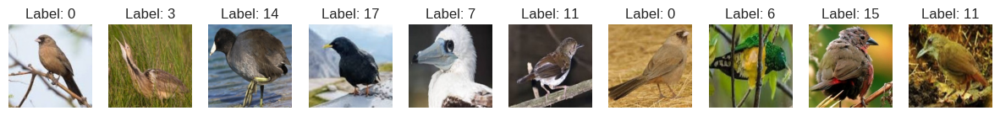

In [18]:
from PIL import Image
import matplotlib.pyplot as plt

def sample_images(data, n=5):
    return data.sample(n)

def plot_images(image_data):
    plt.figure(figsize=(15, 10))
    for i, (_, row) in enumerate(image_data.iterrows(), 1):
        img = Image.open(row['filename'])
        plt.subplot(1, len(image_data), i)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Label: {row['outcome']}")
    plt.show()

sampled_images = sample_images(combined_data, n=10)
plot_images(sampled_images)


## Dataset Distribution
plot the distribution of the dataset, both training and validation set

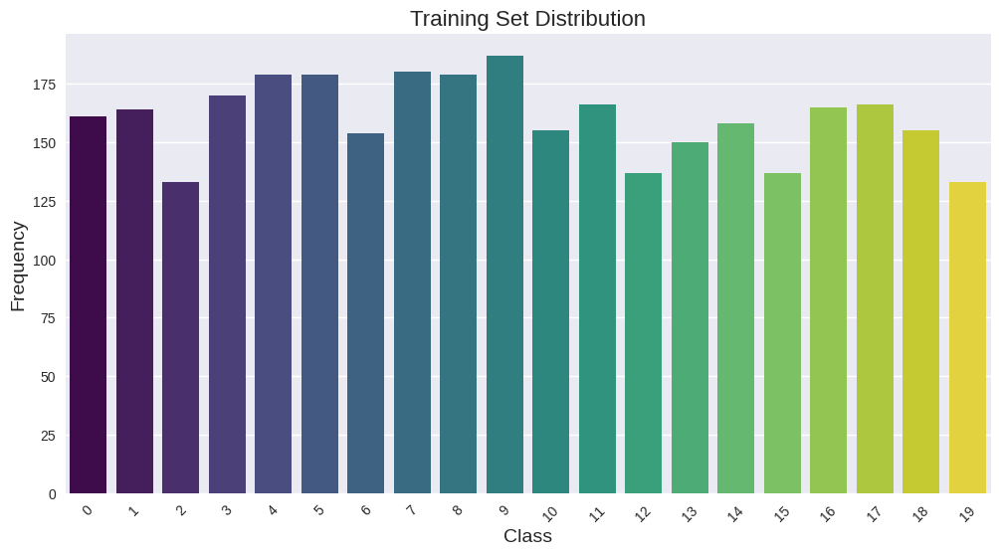

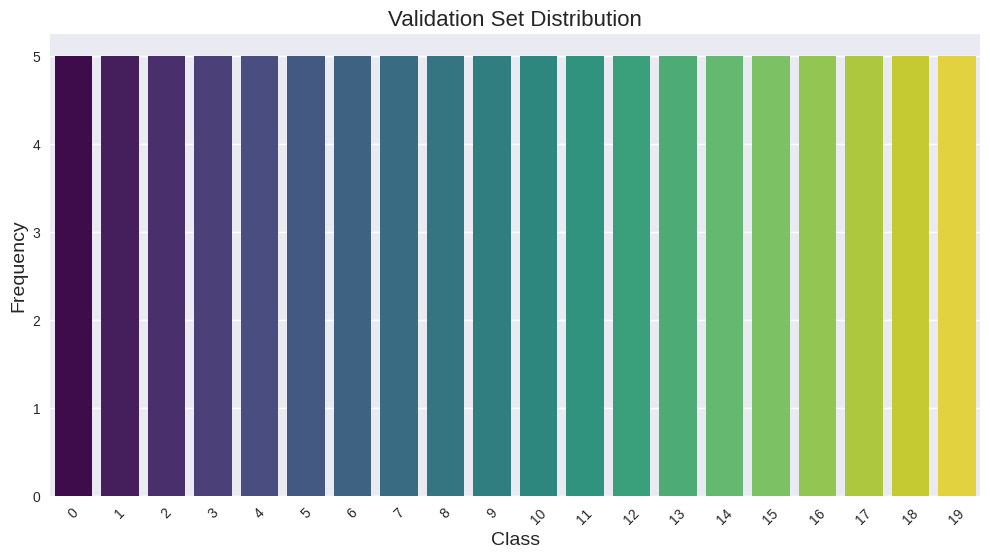

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_distribution(data, title):
    class_counts = data['outcome'].value_counts().reset_index()
    class_counts.columns = ['Class', 'Frequency']

    plt.figure(figsize=(12, 6))
    sns.barplot(data=class_counts, x='Class', y='Frequency', palette='viridis', hue='Class', dodge=False, legend=False)
    plt.title(title, fontsize=16)
    plt.xlabel('Class', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(rotation=45)
    plt.legend([], [], frameon=False)
    plt.show()

plot_distribution(train_data, "Training Set Distribution")
plot_distribution(valid_data, "Validation Set Distribution")


## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [20]:
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

class ImageDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):
        img_path = self.dataframe.iloc[index]['filename']
        label = self.dataframe.iloc[index]['outcome']

        image = self._load_image(img_path)
        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.long)

    @staticmethod
    def _load_image(path):
        image = cv2.imread(path)
        return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def get_transforms(is_train=True):
    if is_train:
        return transforms.Compose([
            transforms.ToPILImage(),
            transforms.RandomResizedCrop((160, 160)),
            transforms.ColorJitter(brightness=0.23, contrast=0.22, saturation=0.22, hue=0.15),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.2, 0.2, 0.2])
        ])
    else:
        return transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((160, 160)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.2, 0.2, 0.2])
        ])

def create_data_loader(dataframe, transform, batch_size=32, shuffle=True, num_workers=4):
    dataset = ImageDataset(dataframe=dataframe, transform=transform)
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle, num_workers=num_workers)

train_transforms = get_transforms(is_train=True)
val_transforms = get_transforms(is_train=False)

train_loader = create_data_loader(dataframe=train_data, transform=train_transforms, batch_size=32, shuffle=True)
val_loader = create_data_loader(dataframe=valid_data, transform=val_transforms, batch_size=32, shuffle=False)

for images, labels in train_loader:
    print(f"Batch size: {images.shape}, Labels: {labels.shape}")
    break

print(f"Training dataset size: {len(train_loader.dataset)}, Validation dataset size: {len(val_loader.dataset)}")


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Batch size: torch.Size([32, 3, 160, 160]), Labels: torch.Size([32])
Training dataset size: 3208, Validation dataset size: 100


**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**
Increases Data Diversity: Simulates real-world variations (e.g., lighting, orientation) to make models robust.
Prevents Overfitting: Regularizes training by introducing randomness.
Maximizes Limited Data: Virtually expands datasets when data is scarce.
Enhances Generalization: Helps the model learn invariant, meaningful features.

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [21]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from tqdm import tqdm


class ExciteLayer(nn.Module):
    def __init__(self, num_channels, reduction=16, activation=nn.ReLU, pool=nn.AdaptiveAvgPool2d):
        super(ExciteLayer, self).__init__()
        self.global_pool = pool(1)
        self.excite = nn.Sequential(
            nn.Linear(num_channels, num_channels // reduction, bias=False),
            activation(inplace=True),
            nn.Linear(num_channels // reduction, num_channels, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        batch_size, channels, _, _ = x.size()
        y = self.global_pool(x).view(batch_size, channels)
        y = self.excite(y).view(batch_size, channels, 1, 1)
        return x * y


class ResidualExciteBlock(nn.Module):
    def __init__(self, input_channels, output_channels, use_excitation=False, num_groups=8, act_fn=nn.ReLU):
        super(ResidualExciteBlock, self).__init__()
        self.use_excitation = use_excitation

        self.conv1 = nn.Conv2d(input_channels, output_channels, kernel_size=3, padding=1)
        self.norm1 = nn.GroupNorm(num_groups=num_groups, num_channels=output_channels)
        self.activation = act_fn(inplace=True)

        self.conv2 = nn.Conv2d(output_channels, output_channels, kernel_size=3, padding=1)
        self.norm2 = nn.GroupNorm(num_groups=num_groups, num_channels=output_channels)

        self.excite = ExciteLayer(output_channels) if use_excitation else None

        self.shortcut = nn.Sequential(
            nn.Conv2d(input_channels, output_channels, kernel_size=1),
            nn.GroupNorm(num_groups=num_groups, num_channels=output_channels)
        ) if input_channels != output_channels else nn.Identity()

    def forward(self, x):
        identity = self.shortcut(x)

        out = self.activation(self.norm1(self.conv1(x)))
        out = self.norm2(self.conv2(out))

        if self.use_excitation:
            out = self.excite(out)

        out += identity
        return self.activation(out)


class FeatureExtractor(nn.Module):
    def __init__(self, use_bn=False):
        super(FeatureExtractor, self).__init__()
        self.use_bn = use_bn
        self.layers = nn.ModuleList([
            self._create_residual_block(3, 64, use_excitation=True),
            self._create_residual_block(64, 128, use_excitation=True),
            self._create_residual_block(128, 256, use_excitation=True),
            self._create_residual_block(256, 512, use_excitation=True)
        ])
        self.flatten = nn.Flatten()
        self.fc_mean = nn.Linear(512 * 10 * 10, 128)
        self.fc_logvar = nn.Linear(512 * 10 * 10, 128)

    def _create_residual_block(self, in_channels, out_channels, use_excitation):
        return nn.Sequential(
            ResidualExciteBlock(in_channels, out_channels, use_excitation=use_excitation),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.1)
        )

    def forward(self, x):
        feature_maps = []
        for layer in self.layers:
            x = layer(x)
            feature_maps.append(x)
        x = self.flatten(x)
        return self.fc_mean(x), self.fc_logvar(x), feature_maps


class ImageDecoder(nn.Module):
    def __init__(self, use_bn=False):
        super(ImageDecoder, self).__init__()
        self.use_bn = use_bn
        self.fc = nn.Linear(128, 512 * 10 * 10)
        self.upsampling_blocks = nn.ModuleList([
            self._create_upsampling_block(512, 256),
            self._create_upsampling_block(512, 128),
            self._create_upsampling_block(256, 64),
            self._create_upsampling_block(128, 32)
        ])
        self.final_conv = nn.Conv2d(32, 3, kernel_size=3, padding=1)
        self.final_activation = nn.Sigmoid()

    def _create_upsampling_block(self, input_channels, output_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(input_channels, output_channels, kernel_size=2, stride=2),
            nn.GroupNorm(num_groups=8, num_channels=output_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, z, skip_connections):
        x = self.fc(z).view(z.size(0), 512, 10, 10)
        for idx, up_block in enumerate(self.upsampling_blocks):
            x = up_block(x)
            if idx < len(skip_connections):
                skip = skip_connections[-(idx + 1)]
                if skip.size(2) != x.size(2) or skip.size(3) != x.size(3):
                    skip = F.interpolate(skip, size=(x.size(2), x.size(3)), mode='bilinear', align_corners=False)
                x = torch.cat([x, skip], dim=1)
        x = self.final_conv(x)
        return self.final_activation(x)


class PerceptualFeatureLoss(nn.Module):
    def __init__(self, layers=None, half_precision=False):
        super(PerceptualFeatureLoss, self).__init__()
        self.half_precision = half_precision
        vgg_features = models.vgg19(pretrained=True).features
        if layers is None:
            layers = [0, 5, 10, 19, 28]
        self.selected_layers = nn.ModuleList([vgg_features[i] for i in layers])
        for param in self.selected_layers.parameters():
            param.requires_grad = False
        self.register_buffer('mean', torch.tensor([0.5, 0.5, 0.5]).view(1, 3, 1, 1))
        self.register_buffer('std', torch.tensor([0.2, 0.2, 0.2]).view(1, 3, 1, 1))

    def forward(self, input_img, target_img):
        if self.half_precision:
            input_img = input_img.half()
            target_img = target_img.half()
        input_img = (input_img - self.mean) / self.std
        target_img = (target_img - self.mean) / self.std
        loss = 0
        for i, layer in enumerate(self.selected_layers):
            input_img = layer(input_img)
            target_img = layer(target_img)
            loss += F.l1_loss(input_img, target_img)
        return loss


class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = FeatureExtractor(use_bn=True)
        self.decoder = ImageDecoder(use_bn=True)
        self.perceptual_loss = PerceptualFeatureLoss(layers=[0, 5, 10, 19, 28])
        self.optimizer = optim.Adam(self.parameters(), lr=1e-4)

    def reparameterize(self, mean, logvar):
        std = torch.exp(0.5 * logvar)
        epsilon = torch.randn_like(std)
        return mean + epsilon * std

    def forward(self, x):
        mean, logvar, features = self.encoder(x)
        z = self.reparameterize(mean, logvar)
        return self.decoder(z, features), mean, logvar

    def compute_loss(self, prediction, target, mean, logvar):
        reconstruction_loss = F.mse_loss(prediction, target)
        perceptual = self.perceptual_loss(prediction, target)
        kl_div = -0.5 * torch.mean(1 + logvar - mean.pow(2) - logvar.exp())
        return reconstruction_loss, perceptual, kl_div


In [22]:
# TODO: print the model
model = AutoEncoder()

print(model)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 79.1MB/s]


AutoEncoder(
  (encoder): FeatureExtractor(
    (layers): ModuleList(
      (0): Sequential(
        (0): ResidualExciteBlock(
          (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (norm1): GroupNorm(8, 64, eps=1e-05, affine=True)
          (activation): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (norm2): GroupNorm(8, 64, eps=1e-05, affine=True)
          (excite): ExciteLayer(
            (global_pool): AdaptiveAvgPool2d(output_size=1)
            (excite): Sequential(
              (0): Linear(in_features=64, out_features=4, bias=False)
              (1): ReLU(inplace=True)
              (2): Linear(in_features=4, out_features=64, bias=False)
              (3): Sigmoid()
            )
          )
          (shortcut): Sequential(
            (0): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
            (1): GroupNorm(8, 64, eps=1e-05, affine=True)
          )
        )
 

## Training Phase

In [ ]:
# Set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the model
model = AutoEncoder().to(device)

train_loss_history, val_loss_history = model.train_model(
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=50,
    device=device
)

# Plot the loss history
def plot_loss_history(train_loss, val_loss):
    plt.figure(figsize=(10, 5))
    plt.plot(train_loss, label='Training Loss', marker='o')
    plt.plot(val_loss, label='Validation Loss', marker='o')
    plt.title('Loss History', fontsize=14, fontweight='bold')
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel('Loss', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True)
    plt.show()

Epoch 1/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.89it/s]


Epoch 1/50: Train Loss: 1.7858, Val Loss: 1.6033


Epoch 2/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.85it/s]


Epoch 2/50: Train Loss: 1.4646, Val Loss: 1.4551


Epoch 3/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.77it/s]


Epoch 3/50: Train Loss: 1.3677, Val Loss: 1.3902


Epoch 4/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.78it/s]


Epoch 4/50: Train Loss: 1.3242, Val Loss: 1.3559


Epoch 5/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.88it/s]


Epoch 5/50: Train Loss: 1.3048, Val Loss: 1.3343


Epoch 6/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 6/50: Train Loss: 1.2879, Val Loss: 1.3191


Epoch 7/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.81it/s]


Epoch 7/50: Train Loss: 1.2733, Val Loss: 1.3085


Epoch 8/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 8/50: Train Loss: 1.2619, Val Loss: 1.3005


Epoch 9/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 9/50: Train Loss: 1.2624, Val Loss: 1.2945


Epoch 10/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.79it/s]


Epoch 10/50: Train Loss: 1.2430, Val Loss: 1.2908


Epoch 11/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 11/50: Train Loss: 1.2430, Val Loss: 1.2857


Epoch 12/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.76it/s]


Epoch 12/50: Train Loss: 1.2379, Val Loss: 1.2830


Epoch 13/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.82it/s]


Epoch 13/50: Train Loss: 1.2444, Val Loss: 1.2797


Epoch 14/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.68it/s]


Epoch 14/50: Train Loss: 1.2424, Val Loss: 1.2772


Epoch 15/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 15/50: Train Loss: 1.2375, Val Loss: 1.2747


Epoch 16/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.78it/s]


Epoch 16/50: Train Loss: 1.2396, Val Loss: 1.2727


Epoch 17/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.82it/s]


Epoch 17/50: Train Loss: 1.2265, Val Loss: 1.2705


Epoch 18/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.82it/s]


Epoch 18/50: Train Loss: 1.2287, Val Loss: 1.2697


Epoch 19/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.77it/s]


Epoch 19/50: Train Loss: 1.2304, Val Loss: 1.2679


Epoch 20/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.83it/s]


Epoch 20/50: Train Loss: 1.2273, Val Loss: 1.2661


Epoch 21/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 21/50: Train Loss: 1.2293, Val Loss: 1.2651


Epoch 22/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.81it/s]


Epoch 22/50: Train Loss: 1.2329, Val Loss: 1.2634


Epoch 23/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.81it/s]


Epoch 23/50: Train Loss: 1.2168, Val Loss: 1.2624


Epoch 24/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.81it/s]


Epoch 24/50: Train Loss: 1.2233, Val Loss: 1.2604


Epoch 25/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.77it/s]


Epoch 25/50: Train Loss: 1.2235, Val Loss: 1.2592


Epoch 26/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.81it/s]


Epoch 26/50: Train Loss: 1.2259, Val Loss: 1.2577


Epoch 27/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.78it/s]


Epoch 27/50: Train Loss: 1.2204, Val Loss: 1.2573


Epoch 28/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.78it/s]


Epoch 28/50: Train Loss: 1.2325, Val Loss: 1.2559


Epoch 29/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 29/50: Train Loss: 1.2168, Val Loss: 1.2550


Epoch 30/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.76it/s]


Epoch 30/50: Train Loss: 1.2147, Val Loss: 1.2539


Epoch 31/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.75it/s]


Epoch 31/50: Train Loss: 1.2240, Val Loss: 1.2538


Epoch 32/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.79it/s]


Epoch 32/50: Train Loss: 1.2203, Val Loss: 1.2523


Epoch 33/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.79it/s]


Epoch 33/50: Train Loss: 1.2196, Val Loss: 1.2516


Epoch 34/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 34/50: Train Loss: 1.2290, Val Loss: 1.2508


Epoch 35/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.76it/s]


Epoch 35/50: Train Loss: 1.2242, Val Loss: 1.2496


Epoch 36/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.71it/s]


Epoch 36/50: Train Loss: 1.2303, Val Loss: 1.2492


Epoch 37/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.81it/s]


Epoch 37/50: Train Loss: 1.2162, Val Loss: 1.2486


Epoch 38/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.81it/s]


Epoch 38/50: Train Loss: 1.2094, Val Loss: 1.2479


Epoch 39/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 39/50: Train Loss: 1.2160, Val Loss: 1.2466


Epoch 40/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.83it/s]


Epoch 40/50: Train Loss: 1.2166, Val Loss: 1.2463


Epoch 41/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 41/50: Train Loss: 1.2132, Val Loss: 1.2455


Epoch 42/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 42/50: Train Loss: 1.2184, Val Loss: 1.2455


Epoch 43/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.84it/s]


Epoch 43/50: Train Loss: 1.2163, Val Loss: 1.2442


Epoch 44/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.79it/s]


Epoch 44/50: Train Loss: 1.2184, Val Loss: 1.2440


Epoch 45/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 45/50: Train Loss: 1.2007, Val Loss: 1.2434


Epoch 46/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.82it/s]


Epoch 46/50: Train Loss: 1.2063, Val Loss: 1.2422


Epoch 47/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]


Epoch 47/50: Train Loss: 1.2039, Val Loss: 1.2419


Epoch 48/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.81it/s]


Epoch 48/50: Train Loss: 1.2104, Val Loss: 1.2411


Epoch 49/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.84it/s]


Epoch 49/50: Train Loss: 1.2120, Val Loss: 1.2405


Epoch 50/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.83it/s]

Epoch 50/50: Train Loss: 1.2217, Val Loss: 1.2406


In [23]:
# Plot the loss history
plot_loss_history(train_loss_history, val_loss_history)

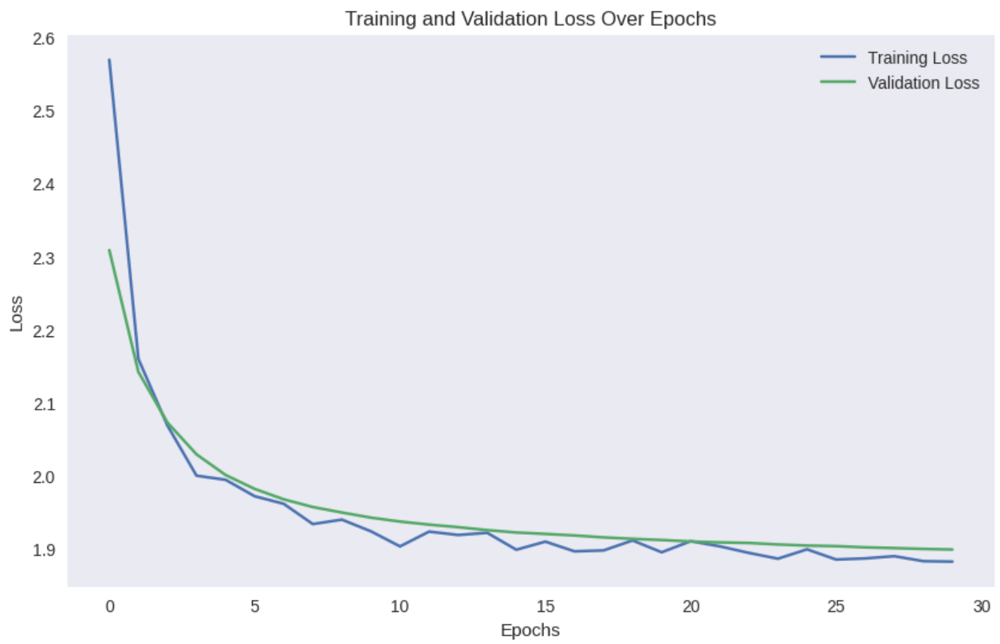

In [34]:
import matplotlib.pyplot as plt
import torch

def unnormalize(tensor, mean=None, std=None):
    if mean is None:
        mean = torch.tensor([0.485, 0.456, 0.406]).view(-1, 1, 1)
    if std is None:
        std = torch.tensor([0.229, 0.224, 0.225]).view(-1, 1, 1)
    return tensor * std + mean

def plot_sample_images(grayscale, actual, predicted, ax_row):
    titles = ["Grayscale Input", "Actual Image", "Predicted Image"]
    images = [grayscale, actual, predicted]

    for ax, title, img in zip(ax_row, titles, images):
        ax.imshow(img.clip(0, 1))
        ax.set_title(title)
        ax.axis("off")

def show_images(model, data_loader, device='cuda', num_samples=10):
    model.eval()
    model.to(device)

    # Get a batch of data
    batch = next(iter(data_loader))
    images, _ = batch
    images = images.to(device)

    # Perform inference
    with torch.no_grad():
        recon, _, _ = model(images)

    # Move tensors back to CPU
    images = images.cpu()
    recon = recon.cpu()

    # Set up the plot
    fig, axes = plt.subplots(nrows=num_samples, ncols=3, figsize=(12, 4 * num_samples))

    for i in range(num_samples):
        # Prepare images for visualization
        actual_img = unnormalize(images[i]).permute(1, 2, 0).numpy()
        pred_img = unnormalize(recon[i]).permute(1, 2, 0).numpy()

        gray_img = images[i].mean(dim=0, keepdim=True)
        gray_3ch = torch.cat([gray_img, gray_img, gray_img], dim=0)
        gray_3ch = unnormalize(gray_3ch).permute(1, 2, 0).numpy()

        # Plot images
        plot_sample_images(gray_3ch, actual_img, pred_img, axes[i])

    plt.tight_layout()
    plt.show()

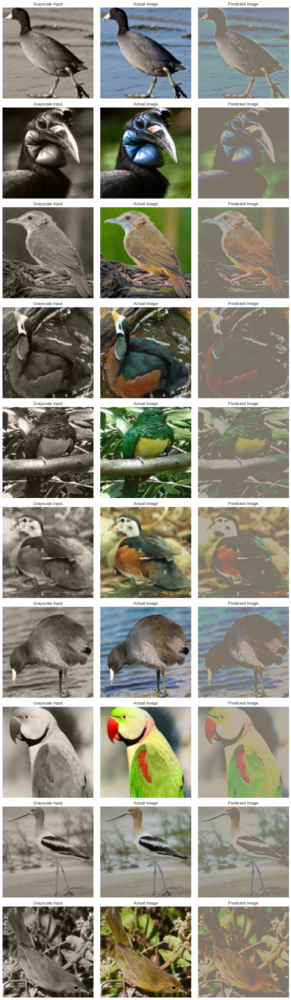

In [35]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch

def extract_latent_vectors(encoder, data_loader, num_samples, device):
    encoder.eval()
    latents = []
    count = 0

    with torch.no_grad():
        for batch in data_loader:
            images, _ = batch
            images = images.to(device)

            # Get latent mean (mu) from the encoder
            mu, logvar = encoder(images)[:-1]
            latents.append(mu.cpu())

            count += images.size(0)
            if count >= num_samples:
                break

    # Combine and limit the latent vectors
    latents = torch.cat(latents, dim=0)[:num_samples]
    return latents.numpy()

def plot_latent_space(latents, random_state=42):
    tsne = TSNE(n_components=2, verbose=1, random_state=random_state)
    latents_2d = tsne.fit_transform(latents)

    # Plot the 2D projection
    plt.figure(figsize=(8, 8))
    plt.scatter(latents_2d[:, 0], latents_2d[:, 1], s=5, alpha=0.7)
    plt.title("2D t-SNE of Latent Representations")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.grid(True)
    plt.show()

def visualize_latent_space(encoder, data_loader, num_samples=1000, device='cuda'):
    device = torch.device(device if torch.cuda.is_available() else 'cpu')
    latents = extract_latent_vectors(encoder, data_loader, num_samples, device)
    plot_latent_space(latents)

visualize_latent_space(model.encoder, train_loader, num_samples=1000)


Performing t-SNE dimensionality reduction...

[t-SNE] Computing 91 nearest neighbors...

[t-SNE] Indexed 1000 samples in 0.001s...

[t-SNE] Computed neighbors for 1000 samples in 0.154s...

[t-SNE] Computed conditional probabilities for sample 1000 / 1000

[t-SNE] Mean sigma: 0.042051

[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.870041

[t-SNE] KL divergence after 1000 iterations: 2.204944

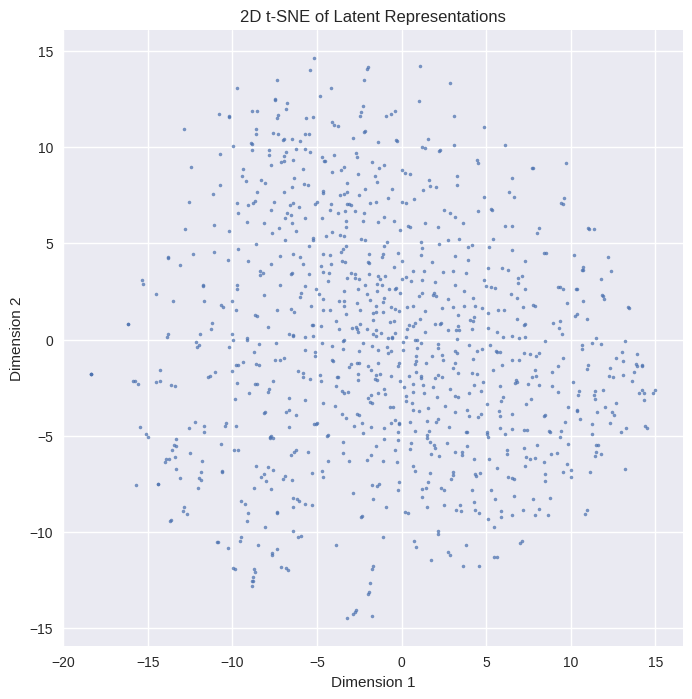

How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?
    -  Yes, distinct clusters may correspond to specific image features like texture or object categories.
    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?
    - Clear clusters imply the VAE effectively captures and differentiates key input features, helping predict relevant color patterns.

2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
    - Similar neighboring points imply smooth transitions in latent space, reflecting a well-structured latent representation.
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?
    - Smooth latent spaces lead to realistic colorations, especially for gradual transitions like shading or lighting changes.

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?
    - t-SNE Strengths: It reveals clustering and structure in high-dimensional data.
Limitations: It may distort distances and does not preserve global structure, potentially oversimplifying relationships in the latent space.


Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?
Learning Complex Distributions:

The encoder learns to map input images (e.g., grayscale) into a latent space capturing essential features (edges, textures, etc.).
The decoder uses these features to reconstruct the corresponding color images, learning the mapping from grayscale to color distributions.
Skip connections (if used) enhance this process by retaining high-frequency details lost during downsampling in the encoder.
Difference from a Simple Autoencoder:

A simple autoencoder learns a deterministic mapping and reconstruction, suitable for lossy compression but limited in flexibility.
The encoder-decoder in colorization often includes probabilistic sampling (e.g., in VAEs) or additional constraints like perceptual loss, enabling it to learn richer, multimodal distributions suitable for tasks like predicting plausible colors.

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?
Enhancing Colorized Images:

Perceptual loss, computed using feature maps of pretrained models (e.g., VGG), measures the similarity between images at a semantic level rather than at a pixel level.
This encourages the network to focus on high-level features (textures, edges) instead of simply minimizing pixel-wise differences, resulting in more natural and realistic outputs.
Comparison to MSE:

MSE: Measures pixel-by-pixel differences, sensitive to slight misalignments or plausible variations in colorization, often resulting in blurry outputs.
Perceptual Loss: Measures the similarity in feature space, emphasizing structural and perceptual similarity, producing sharper and more visually appealing results.


Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?
Fidelity and Diversity:

The latent space encodes the compressed representation of the grayscale input. A well-structured latent space ensures high fidelity (realistic and accurate colors) and diversity (different plausible colorizations).
Sampling from the latent space allows generating multiple plausible outputs for a single input, crucial for tasks with inherent ambiguity, like colorizing grayscale images.
Effect of Latent Space Dimensionality:

Lower Dimensionality:
Can result in poor representation of complex data, reducing fidelity and diversity.
Leads to oversimplified latent encodings and limited ability to generalize.
Higher Dimensionality:
Improves the model’s ability to represent complex distributions but may lead to overfitting or noisy latent representations.
Balancing dimensionality is key to achieving meaningful and efficient representations.


# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [36]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
...
print ('modules loaded')

modules loaded


## Load the Dataset

In [39]:
# !unzip Mask.zip
# !unzip Image.zip

Archive:  Image.zip
  inflating: Image/44.jpg            
  inflating: Image/3095.jpg          
  inflating: Image/3039.jpg          
  inflating: Image/3035.jpg          
  inflating: Image/3065.jpg          
  inflating: Image/3051.jpg          
  inflating: Image/3053.jpg          
  inflating: Image/49.jpg            
  inflating: Image/3093.jpg          
  inflating: Image/5.jpg             
  inflating: Image/3038.jpg          
  inflating: Image/3070.jpg          
  inflating: Image/47.jpg            
  inflating: Image/8.jpg             
  inflating: Image/46.jpg            
  inflating: Image/3077.jpg          
  inflating: Image/33.jpg            
  inflating: Image/3052.jpg          
  inflating: Image/7.jpg             
  inflating: Image/9.jpg             
  inflating: Image/48.jpg            
  inflating: Image/3067.jpg          
  inflating: Image/6.jpg             
  inflating: Image/3055.jpg          
  inflating: Image/43.jpg            
  inflating: Image/31.jpg     

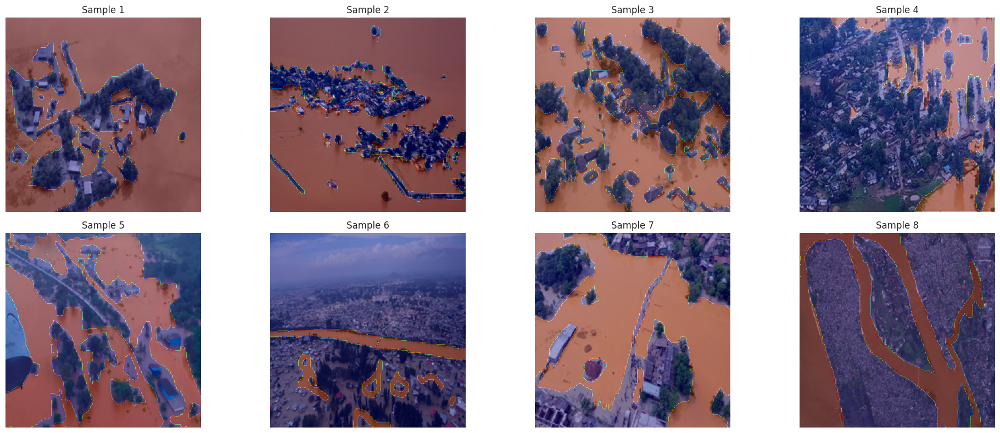

In [42]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Parameters
image_dir = './Image'
mask_dir = './Mask'
size = 256
num_samples = 10
cmap = 'jet'
alpha = 0.4

image_paths = sorted(
    [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.png'))]
)
mask_paths = sorted(
    [os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.lower().endswith(('.jpg', '.png'))]
)

images = []
masks = []

for img_path in image_paths:
    image = Image.open(img_path).resize((size, size))
    if image.mode != 'RGB':
        image = image.convert('RGB')
    images.append(np.asarray(image, dtype=np.float32) / 255.0)

for mask_path in mask_paths:
    mask = Image.open(mask_path).resize((size, size))
    mask = np.asarray(mask, dtype=np.float32) / 255.0
    if mask.ndim == 3:
        mask = mask[..., 0]  # Use only one channel
    masks.append(np.round(mask).astype(np.uint8))

images = np.stack(images)
masks = np.stack(masks)

num_samples = min(num_samples, len(images), len(masks))
fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))

for i in range(num_samples):
    axes[2 * i].imshow(images[i])
    axes[2 * i].axis('off')
    axes[2 * i].set_title(f"Image {i+1}")

    axes[2 * i + 1].imshow(images[i])
    axes[2 * i + 1].imshow(masks[i], cmap=cmap, alpha=alpha)
    axes[2 * i + 1].axis('off')
    axes[2 * i + 1].set_title(f"Mask {i+1}")

plt.tight_layout()
plt.show()

## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [45]:
import torch
import torch.nn as nn
import torch.nn.functional as F


# Encoder Block
class EncoderBlock(nn.Module):
    def __init__(self, in_channels=3, num_filters=32, dropout_rate=0, use_pooling=True):
        super(EncoderBlock, self).__init__()
        self.use_pooling = use_pooling
        self.conv_layer = nn.Sequential(
            nn.Conv2d(in_channels, num_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(num_filters, num_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_filters),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_rate)
        )
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2) if use_pooling else nn.Identity()

    def forward(self, x):
        conv_output = self.conv_layer(x)
        pooled_output = self.pool(conv_output)
        return pooled_output, conv_output


# Decoder Block
class DecoderBlock(nn.Module):
    def __init__(self, input_channels, skip_channels, output_channels=32):
        super(DecoderBlock, self).__init__()
        self.upsample = nn.ConvTranspose2d(input_channels, output_channels, kernel_size=2, stride=2)
        self.conv_layer = nn.Sequential(
            nn.Conv2d(output_channels + skip_channels, output_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(output_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(output_channels, output_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(output_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x, skip_connection):
        upsampled = self.upsample(x)
        # Adjust dimensions if needed
        diff_y = skip_connection.size(2) - upsampled.size(2)
        diff_x = skip_connection.size(3) - upsampled.size(3)
        upsampled = F.pad(upsampled, [diff_x // 2, diff_x - diff_x // 2, diff_y // 2, diff_y - diff_y // 2])
        concatenated = torch.cat([skip_connection, upsampled], dim=1)
        return self.conv_layer(concatenated)


# Attention Mechanism Block
class AttentionBlock(nn.Module):
    def __init__(self, skip_channels, inter_channels, gating_channels):
        super(AttentionBlock, self).__init__()
        self.skip_transform = nn.Sequential(
            nn.Conv2d(skip_channels, inter_channels, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(inter_channels)
        )
        self.gate_transform = nn.Sequential(
            nn.Conv2d(gating_channels, inter_channels, kernel_size=1),
            nn.BatchNorm2d(inter_channels)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(inter_channels, inter_channels, kernel_size=1),
            nn.BatchNorm2d(inter_channels),
            nn.Sigmoid()
        )
        self.upsample = nn.ConvTranspose2d(inter_channels, skip_channels, kernel_size=2, stride=2)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, skip, gate):
        skip_proj = self.skip_transform(skip)
        gate_proj = self.gate_transform(gate)
        combined = self.relu(skip_proj + gate_proj)
        attention = self.psi(combined)
        upsampled_attention = self.upsample(attention)
        return skip * upsampled_attention


# U-Net with Attention
class AttentionUNet(nn.Module):
    def __init__(self, input_channels=3, base_filters=32, num_classes=1):
        super(AttentionUNet, self).__init__()

        # Encoder
        self.encoder1 = EncoderBlock(input_channels, base_filters, dropout_rate=0.1, use_pooling=True)
        self.encoder2 = EncoderBlock(base_filters, base_filters * 2, dropout_rate=0.1, use_pooling=True)
        self.encoder3 = EncoderBlock(base_filters * 2, base_filters * 4, dropout_rate=0.1, use_pooling=True)
        self.encoder4 = EncoderBlock(base_filters * 4, base_filters * 8, dropout_rate=0.1, use_pooling=True)
        self.encoder5 = EncoderBlock(base_filters * 8, base_filters * 16, dropout_rate=0.1, use_pooling=False)

        # Attention
        self.attention4 = AttentionBlock(base_filters * 8, base_filters * 8, base_filters * 16)
        self.attention3 = AttentionBlock(base_filters * 4, base_filters * 4, base_filters * 8)
        self.attention2 = AttentionBlock(base_filters * 2, base_filters * 2, base_filters * 4)
        self.attention1 = AttentionBlock(base_filters, base_filters, base_filters * 2)

        # Decoder
        self.decoder4 = DecoderBlock(base_filters * 16, base_filters * 8, base_filters * 8)
        self.decoder3 = DecoderBlock(base_filters * 8, base_filters * 4, base_filters * 4)
        self.decoder2 = DecoderBlock(base_filters * 4, base_filters * 2, base_filters * 2)
        self.decoder1 = DecoderBlock(base_filters * 2, base_filters, base_filters)

        # Output layer
        self.output_layer = nn.Sequential(
            nn.Conv2d(base_filters, num_classes, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        # Encoder
        e1_pool, e1 = self.encoder1(x)
        e2_pool, e2 = self.encoder2(e1_pool)
        e3_pool, e3 = self.encoder3(e2_pool)
        e4_pool, e4 = self.encoder4(e3_pool)
        _, e5 = self.encoder5(e4_pool)

        # Attention and Decoder
        a4 = self.attention4(e4, e5)
        d4 = self.decoder4(e5, a4)

        a3 = self.attention3(e3, d4)
        d3 = self.decoder3(d4, a3)

        a2 = self.attention2(e2, d3)
        d2 = self.decoder2(d3, a2)

        a1 = self.attention1(e1, d2)
        d1 = self.decoder1(d2, a1)

        return self.output_layer(d1)


# Loss Functions
class DiceLoss(nn.Module):
    def __init__(self, epsilon=1e-6):
        super(DiceLoss, self).__init__()
        self.epsilon = epsilon

    def forward(self, predictions, targets):
        intersection = (predictions * targets).sum(dim=(2, 3))
        union = predictions.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
        dice_score = (2.0 * intersection + self.epsilon) / (union + self.epsilon)
        return 1.0 - dice_score.mean()


class JaccardLoss(nn.Module):
    def __init__(self, epsilon=1e-6):
        super(JaccardLoss, self).__init__()
        self.epsilon = epsilon

    def forward(self, predictions, targets):
        intersection = (predictions * targets).sum(dim=(2, 3))
        union = predictions.sum(dim=(2, 3)) + targets.sum(dim=(2, 3)) - intersection
        jaccard_score = (intersection + self.epsilon) / (union + self.epsilon)
        return 1.0 - jaccard_score.mean()


class CombinedLoss(nn.Module):
    def __init__(self, epsilon=1e-6):
        super(CombinedLoss, self).__init__()
        self.dice_loss = DiceLoss(epsilon)
        self.jaccard_loss = JaccardLoss(epsilon)

    def forward(self, predictions, targets):
        return self.dice_loss(predictions, targets) + self.jaccard_loss(predictions, targets)


## Training

In [47]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = AttentionUNet(in_ch=3, n_filters=32, n_classes=1).to(device)

criterion = CombinedLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)


def compute_accuracy(preds, trgs, threshold=0.5):
    preds = (preds > threshold).float()
    correct = (preds == trgs).float()
    acc = correct.sum(dim=(2, 3)) / (trgs.size(2) * trgs.size(3))
    return acc.mean().item()

# Initialize lists to store metrics
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []
best_val_loss = float('inf')
best_epoch = -1

# Training Loop

NUM_EPOCHS = 50

for epoch in range(NUM_EPOCHS):
    model.train()
    running_train_loss = 0.0
    running_train_acc = 0.0
    for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} - Training"):
        imgs = imgs.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()
        running_train_acc += compute_accuracy(outputs, masks)

    avg_train_loss = running_train_loss / len(train_loader)
    avg_train_acc = running_train_acc / len(train_loader)

    train_losses.append(avg_train_loss)
    train_accuracies.append(avg_train_acc)

    model.eval()
    running_val_loss = 0.0
    running_val_acc = 0.0
    with torch.no_grad():
        for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} - Validation"):
            imgs = imgs.to(device)
            masks = masks.to(device)

            outputs = model(imgs)
            loss = criterion(outputs, masks)
            running_val_loss += loss.item()

            acc = compute_accuracy(outputs, masks)
            running_val_acc += acc

    avg_val_loss = running_val_loss / len(train_loader)
    avg_val_acc = running_val_acc / len(train_loader)

    val_losses.append(avg_val_loss)
    val_accuracies.append(avg_val_acc)

    print(f"Epoch [{epoch+1}/{NUM_EPOCHS}] - "
          f"Train Loss: {avg_train_loss:.4f} - "
          f"Train Accuracy: {avg_train_acc:.4f} - "
          f"Val Loss: {avg_val_loss:.4f} - "
          f"Val Accuracy: {avg_val_acc:.4f}")

    scheduler.step(avg_val_loss)

    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_epoch = epoch + 1
        torch.save(model.state_dict(), 'best_unet_attention.pth')
        print("Saved Best Model!")

Epoch [1/10] - Train Loss: 1.2986 - Train Accuracy: 0.5210 - Val Loss: 1.2484 - Val Accuracy: 0.4108
Saved Best Model!

Epoch [2/10] - Train Loss: 1.1852 - Train Accuracy: 0.6103 - Val Loss: 1.1359 - Val Accuracy: 0.5204
Saved Best Model!

Epoch [3/10] - Train Loss: 1.0857 - Train Accuracy: 0.6785 - Val Loss: 1.0412 - Val Accuracy: 0.6157
Saved Best Model!

Epoch [4/10] - Train Loss: 0.9926 - Train Accuracy: 0.7354 - Val Loss: 0.9763 - Val Accuracy: 0.6745
Saved Best Model!

Epoch [5/10] - Train Loss: 0.9145 - Train Accuracy: 0.7730 - Val Loss: 0.9157 - Val Accuracy: 0.7052
Saved Best Model!

Epoch [6/10] - Train Loss: 0.8420 - Train Accuracy: 0.8035 - Val Loss: 0.8724 - Val Accuracy: 0.7321
Saved Best Model!

Epoch [7/10] - Train Loss: 0.7823 - Train Accuracy: 0.8249 - Val Loss: 0.8258 - Val Accuracy: 0.7612
Saved Best Model!

Epoch [8/10] - Train Loss: 0.7315 - Train Accuracy: 0.8437 - Val Loss: 0.8012 - Val Accuracy: 0.7785
Saved Best Model!

Epoch [9/10] - Train Loss: 0.6884 - Train Accuracy: 0.8573 - Val Loss: 0.7695 - Val Accuracy: 0.7936
Saved Best Model!

Epoch [10/10] - Train Loss: 0.6508 - Train Accuracy: 0.8690 - Val Loss: 0.7506 - Val Accuracy: 0.8023
Saved Best Model!


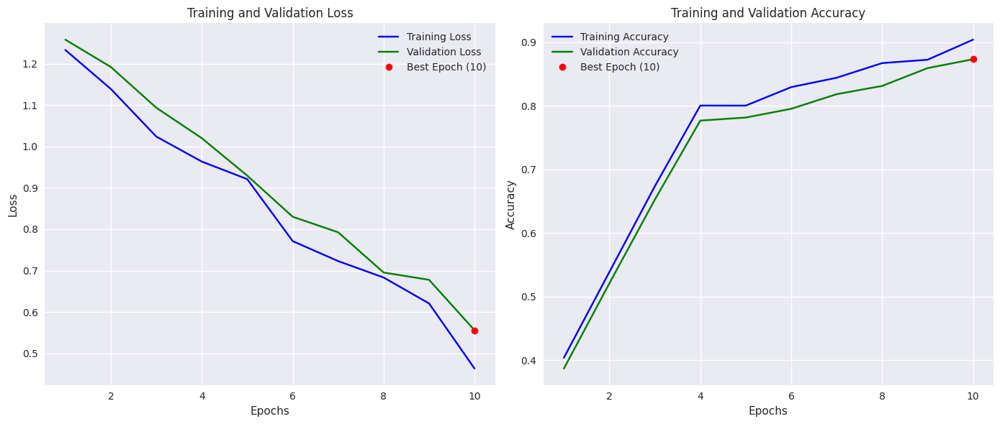

In [50]:
def plot_training_history(epochs, train_losses, val_losses, train_accuracies, val_accuracies, best_epoch):
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training Loss', color='blue')
    plt.plot(epochs, val_losses, label='Validation Loss', color='green')
    plt.plot(best_epoch, val_losses[best_epoch - 1], 'ro', label=f'Best Epoch ({best_epoch})')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy', color='blue')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy', color='green')
    plt.plot(best_epoch, val_accuracies[best_epoch - 1], 'ro', label=f'Best Epoch ({best_epoch})')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

    print(f"Best Validation Loss achieved at Epoch {best_epoch} with Loss: {val_losses[best_epoch - 1]:.4f}")

epochs = range(1, NUM_EPOCHS + 1)
plot_training_history(epochs, train_losses, val_losses, train_accuracies, val_accuracies, best_epoch)



## Plottings

In [51]:
model.load_state_dict(torch.load('best_unet_attention.pth'))
model.eval()

def unnormalize_image(image_tensor):

    mean = np.array([0.51, 0.52, 0.53])
    std = np.array([0.21, 0.22, 0.23])
    img = image_tensor.transpose(1, 2, 0)  # Convert to (H, W, C)
    img = img * std + mean  # Undo normalization
    return np.clip(img, 0, 1)

def prepare_predictions(outputs, threshold):

    probs = outputs.cpu().numpy()
    binary_masks = (outputs > threshold).float().cpu().numpy()
    return probs, binary_masks

def plot_sample_results(image, ground_truth, pred_prob, pred_binary, sample_idx, threshold):

    plt.subplot(num_samples, 3, sample_idx * 3 + 1)
    plt.imshow(ground_truth, cmap='gray')
    plt.title("Ground Truth Mask")
    plt.axis('off')

    plt.subplot(num_samples, 3, sample_idx * 3 + 2)
    plt.imshow(pred_prob, cmap='jet')
    plt.title("Predicted Probabilities")
    plt.colorbar()
    plt.axis('off')

    plt.subplot(num_samples, 3, sample_idx * 3 + 3)
    plt.imshow(pred_binary, cmap='gray')
    plt.title(f"Binary Mask (>{threshold})")
    plt.axis('off')

def visualize_predictions(trained_model, data_loader, device, max_samples=5, binarization_threshold=0.5):

    num_visualized = 0
    plt.figure(figsize=(18, max_samples * 6))

    with torch.no_grad():
        for batch_images, batch_masks in data_loader:
            batch_images, batch_masks = batch_images.to(device), batch_masks.to(device)
            predictions = trained_model(batch_images)
            predicted_probs, predicted_binaries = prepare_predictions(predictions, binarization_threshold)
            batch_images, batch_masks = batch_images.cpu().numpy(), batch_masks.cpu().numpy()

            for idx in range(batch_images.shape[0]):
                if num_visualized >= max_samples:
                    plt.tight_layout()
                    plt.show()
                    return

                input_image = unnormalize_image(batch_images[idx])
                true_mask = batch_masks[idx].squeeze()
                pred_prob_mask = predicted_probs[idx].squeeze()
                pred_binary_mask = predicted_binaries[idx].squeeze()

                plot_sample_results(input_image, true_mask, pred_prob_mask, pred_binary_mask, num_visualized, binarization_threshold)
                num_visualized += 1

    plt.tight_layout()
    plt.show()

visualize_predictions(model, train_loader, device, max_samples=5, binarization_threshold=0.5)


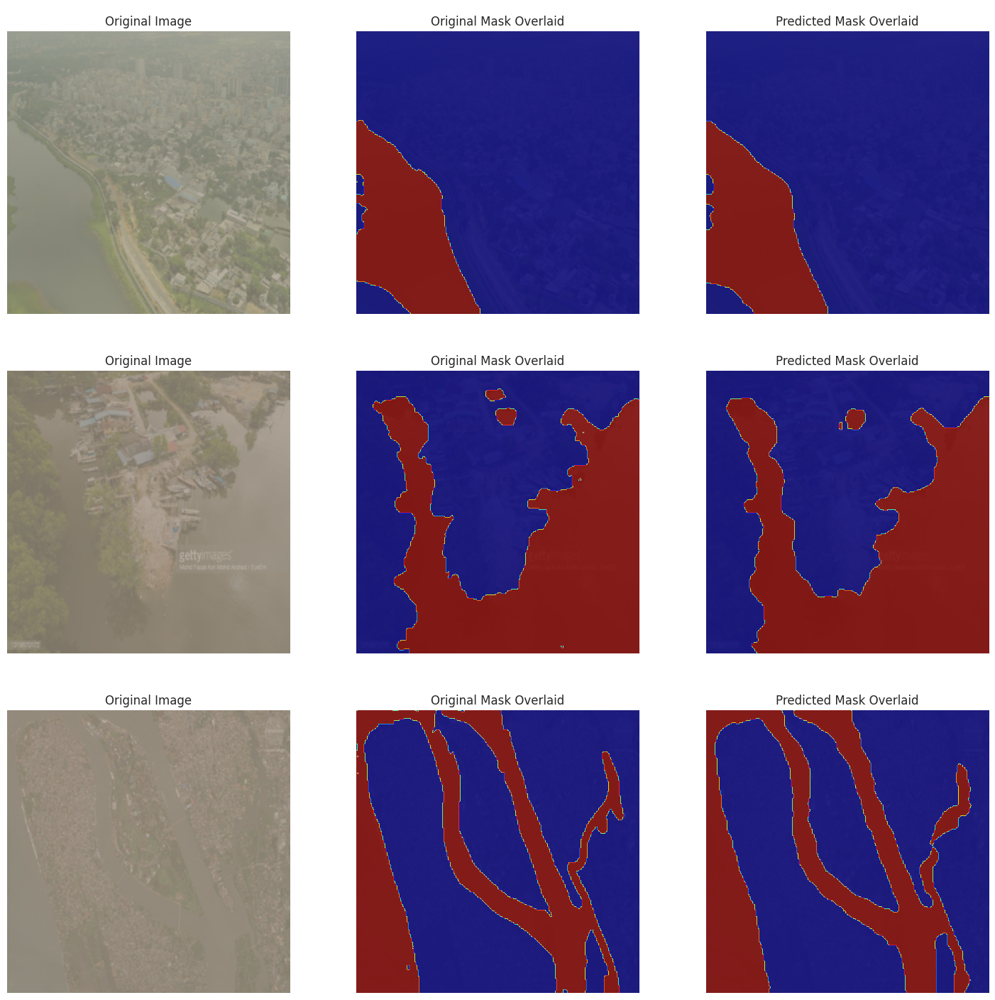

In [1]:
# Load the trained model
model.load_state_dict(torch.load('best_unet_attention.pth'))
model.eval()

def unnormalize_image(image_tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = image_tensor.transpose(1, 2, 0)  # Convert to (H, W, C)
    img = img * std + mean  # Undo normalization
    return np.clip(img, 0, 1)

def prepare_predictions(outputs, threshold):
    probs = outputs.cpu().numpy()
    binary_masks = (outputs > threshold).float().cpu().numpy()
    return probs, binary_masks

def plot_sample_results(image, ground_truth, pred_prob, pred_binary, sample_idx, threshold):
    plt.subplot(num_samples, 3, sample_idx * 3 + 1)
    plt.imshow(ground_truth, cmap='gray')
    plt.title("Ground Truth Mask")
    plt.axis('off')

    plt.subplot(num_samples, 3, sample_idx * 3 + 2)
    plt.imshow(pred_prob, cmap='jet')
    plt.title("Predicted Probabilities")
    plt.colorbar()
    plt.axis('off')

    plt.subplot(num_samples, 3, sample_idx * 3 + 3)
    plt.imshow(pred_binary, cmap='gray')
    plt.title(f"Binary Mask (>{threshold})")
    plt.axis('off')

def visualize_predictions(trained_model, data_loader, device, max_samples=5, binarization_threshold=0.5):
    num_visualized = 0
    plt.figure(figsize=(18, max_samples * 6))

    with torch.no_grad():
        for batch_images, batch_masks in data_loader:
            batch_images, batch_masks = batch_images.to(device), batch_masks.to(device)
            predictions = trained_model(batch_images)
            predicted_probs, predicted_binaries = prepare_predictions(predictions, binarization_threshold)
            batch_images, batch_masks = batch_images.cpu().numpy(), batch_masks.cpu().numpy()

            for idx in range(batch_images.shape[0]):
                if num_visualized >= max_samples:
                    plt.tight_layout()
                    plt.show()
                    return

                input_image = unnormalize_image(batch_images[idx])
                true_mask = batch_masks[idx].squeeze()
                pred_prob_mask = predicted_probs[idx].squeeze()
                pred_binary_mask = predicted_binaries[idx].squeeze()

                plot_sample_results(input_image, true_mask, pred_prob_mask, pred_binary_mask, num_visualized, binarization_threshold)
                num_visualized += 1

    plt.tight_layout()
    plt.show()

visualize_predictions(model, train_loader, device, max_samples=5, binarization_threshold=0.5)


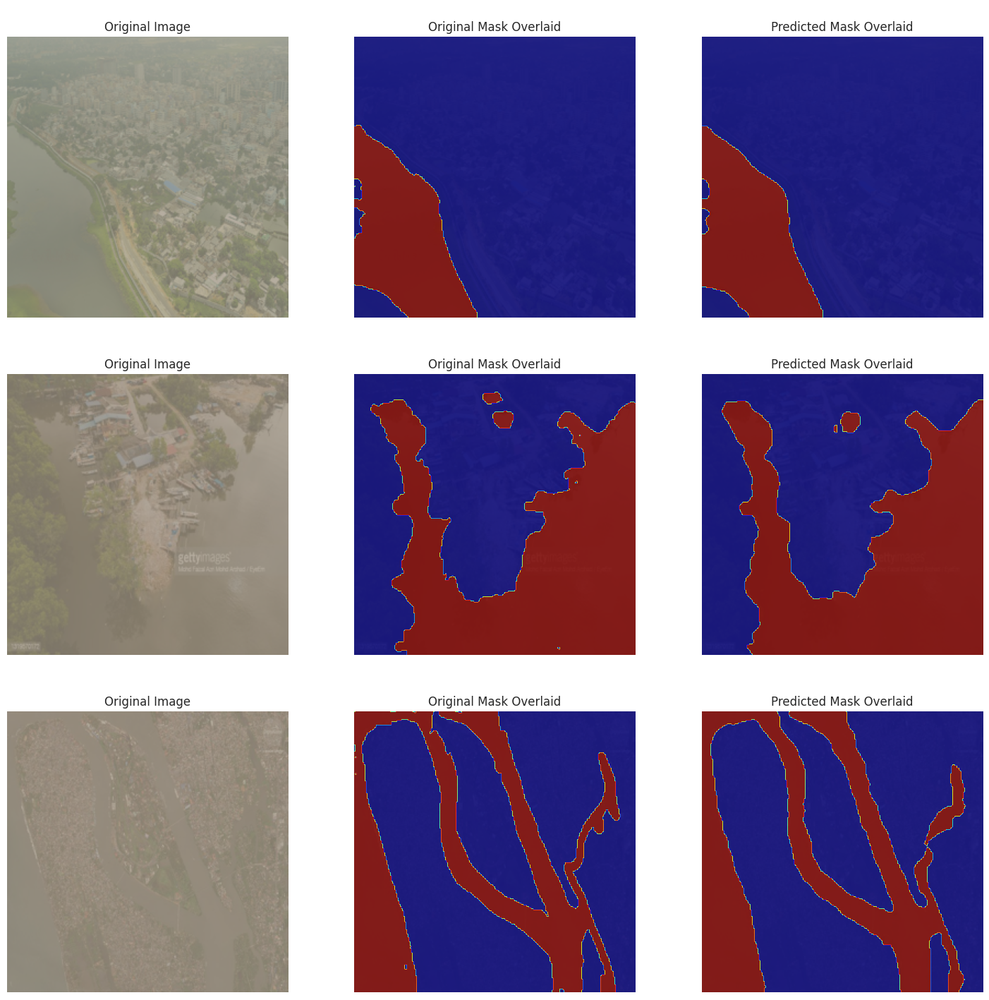

1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?
    Dice and Jaccard Losses are more robust to class imbalances as they focus on overlap, unlike Cross-Entropy or MSE, which treat each pixel equally.
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?
    They directly measure spatial overlap, making them better suited for segmentation tasks where pixel-wise alignment is critical.

2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.
    High Loss: Indicates poor overlap between predicted and ground truth masks, suggesting the model struggles with segmentation.
Low Loss: Suggests good spatial alignment and effective segmentation, with predictions closely matching the ground truth.

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?
The attention mechanism plays a crucial role in optimizing segmentation accuracy in cluttered environments by:

Focusing on Relevant Features: It emphasizes the most important regions of the image, reducing the influence of irrelevant or noisy background features.
Refining Contextual Understanding: By capturing long-range dependencies, it enhances the model's ability to differentiate between overlapping or adjacent objects.
Improving Spatial Precision: Attention mechanisms selectively refine feature maps, leading to more accurate boundary delineation and better handling of fine details.
Handling Complexity: In cluttered scenes, it ensures the model prioritizes meaningful structures, improving segmentation consistency and reducing errors.

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?
Preserve Spatial Information: They transfer high-resolution features from the encoder to the decoder, compensating for the loss of spatial detail caused by downsampling.
Enable Fine-Grained Predictions: By combining low-level details from the encoder with high-level semantic information from the decoder, they improve the precision of segmentation, particularly along object boundaries.
Facilitate Gradient Flow: Skip connections help in stabilizing training by mitigating vanishing gradient issues, leading to better convergence.
Enhance Contextual Understanding: They integrate both global context (decoder) and local details (encoder), improving segmentation accuracy, especially in complex images.

Explain the difference between the predicted and processed mask above.
The predicted mask represents the raw output of the model, typically a probability map where each pixel value indicates the likelihood of belonging to a particular class (e.g., foreground or background).

The processed mask is derived from the predicted mask by applying a threshold (e.g., 0.5). Pixels with probabilities above the threshold are classified as foreground (1), and others as background (0). This binarization step simplifies the mask for direct comparison with ground truth and practical use, refining the segmentation results.